In [1]:
import os
import time
import sys
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

from skimage.morphology import label
from skimage.data import imread

In [2]:
# CONFIG

SHIP_CLASS_NAME = 'ship'
IMAGE_WIDTH     = 768
IMAGE_HEIGHT    = 768
SHAPE           = (IMAGE_WIDTH, IMAGE_HEIGHT)
WORKING_DIR     = '/home/jupyter/'
INPUT_DIR       = '/home/jupyter/Data/input'
OUTPUT_DIR      = '/home/jupyter/Data/output'

TRAIN_DATA_PATH               = os.path.join(INPUT_DIR, 'train_v2')
TEST_DATA_PATH                = os.path.join(INPUT_DIR, 'test_v2')
TRAIN_SHIP_SEGMENTATIONS_PATH = os.path.join(INPUT_DIR, 'train_ship_segmentations_v2.csv')
MASK_RCNN_PATH                = os.path.join(WORKING_DIR, 'Mask_RCNN-master')
COCO_WEIGHTS_PATH             = os.path.join(WORKING_DIR, "mask_rcnn_coco.h5")

In [3]:
train_dataset = os.listdir(TRAIN_DATA_PATH)
test_dataset = os.listdir(TEST_DATA_PATH)

print('Number of train dataset images: {}'.format(len(train_dataset)))
print('Number of test dataset images: {}'.format(len(test_dataset)))

Number of train dataset images: 192556
Number of test dataset images: 15606


In [4]:
masks = pd.read_csv(TRAIN_SHIP_SEGMENTATIONS_PATH, engine='python')
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


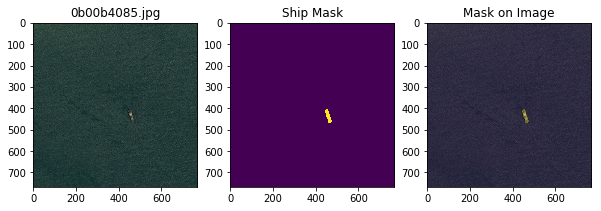

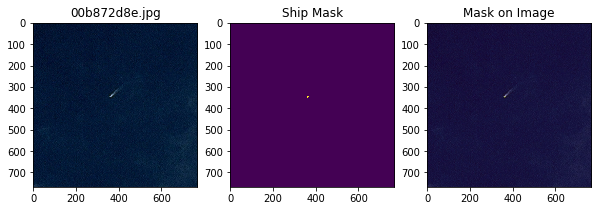

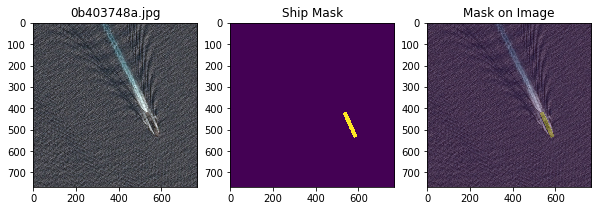

In [5]:
'''
run length encoding and decoding.

https://www.kaggle.com/lifa08/run-length-encode-and-decode
'''

def rle_encode(img):
    '''
    run length encoding:
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated: [start0] [length0] [start1] [length1]... in 1d array
    '''
    # reshape to 1d array
    pixels = img.T.flatten() # Needed to align to RLE direction
    # pads the head & the tail with 0 & converts to ndarray
    pixels = np.concatenate([[0], pixels, [0]])
    # gets all start(0->1) & end(1->0) positions 
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    # transforms end positions to lengths
    runs[1::2] -= runs[::2]
    # converts to the string formated: '[s0] [l0] [s1] [l1]...'
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=SHAPE):
    '''
    mask_rle: run-length as string formated: [start0] [length0] [start1] [length1]... in 1d array
    shape: (height,width) of array to return 
    Returns numpy array according to the shape, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    # gets starts & lengths 1d arrays 
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    # gets ends 1d array
    ends = starts + lengths
    # creates blank mask image 1d array
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    # sets mark pixles
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    # reshape as a 2d mask image
    return img.reshape(shape).T  # Needed to align to RLE direction

def masks_as_image(in_mask_list, shape=SHAPE):
    '''
    Take the individual ship masks and create a single mask array for all ships
    in_mask_list: pd Series: [idx0] [RLE string0]...
    Returns numpy array as (shape.h, shape.w, 1)
    '''
    all_masks = np.zeros(shape, dtype = np.int16)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask)
    return np.expand_dims(all_masks, -1)

def multi_rle_encode(img):
    labels = label(img[:, :, 0])
    return [rle_encode(labels == k) for k in np.unique(labels[labels > 0])]

def display_decode_encode(image_id, path=TRAIN_DATA_PATH):
    '''
    Show image, ship mask, and encoded/decoded mask
    '''
    fig, axarr = plt.subplots(1, 3, figsize = (10, 5))

    # image
    img_0 = imread(os.path.join(path, image_id))
    axarr[0].imshow(img_0)
    axarr[0].set_title(image_id)
    
    # input mask
    rle_1 = masks.query('ImageId=="{}"'.format(image_id))['EncodedPixels']
    img_1 = masks_as_image(rle_1)
    axarr[1].imshow(img_1[:, :, 0])
    axarr[1].set_title('Ship Mask')
    
    # encode & decode mask 
    rle_2 = multi_rle_encode(img_1)
    img_2 = masks_as_image(rle_2)
    axarr[2].imshow(img_0)
    axarr[2].imshow(img_2[:, :, 0], alpha=0.3)
    axarr[2].set_title('Mask on Image')
    
    plt.show()

# inspects a few example
display_decode_encode('0b00b4085.jpg')
display_decode_encode('00b872d8e.jpg')
display_decode_encode('0b403748a.jpg')

,ImageId,Ships,RLEMaskList
93034,7ba49f141.jpg,1,[541225 2 541993 4 542760 5 543528 4 544295 5 ...
77062,666e8563f.jpg,1,[213769 10 214537 10 215305 10 216073 10 21684...
90580,784e6a297.jpg,1,[556280 2 557045 5 557810 9 558575 12 559340 1...


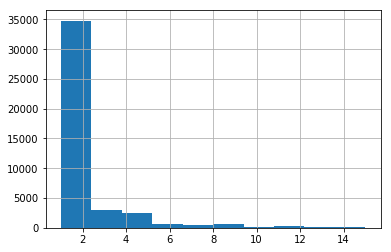

In [6]:
# Check if a mask has a ship and create the ships column
# if the image has EncodedPixels then set ships column to 1 else 0
masks['Ships'] = masks['EncodedPixels'].map(lambda encoded_pixels: 1 if isinstance(encoded_pixels, str) else 0)

# Create the unique image id and the rle_mask list
unique_img_ids = masks.groupby('ImageId').agg({'Ships': 'sum'})
unique_img_ids['RLEMaskList'] = masks.groupby('ImageId')['EncodedPixels'].apply(list)
unique_img_ids = unique_img_ids.reset_index()

# Image with ships
unique_img_ids = unique_img_ids[unique_img_ids['Ships'] > 0]
unique_img_ids['Ships'].hist()
unique_img_ids.sample(3)

34044 training masks
8512 validation masks


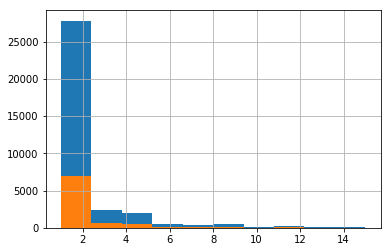

In [7]:
# Split the dataset to training & validation set
from sklearn.model_selection import train_test_split

TRAINING_VALIDATION_RATIO = 0.2
train_ids, val_ids = train_test_split(unique_img_ids, 
                                      test_size=TRAINING_VALIDATION_RATIO, 
                                      stratify=unique_img_ids['Ships'])
train_ids['Ships'].hist()
val_ids['Ships'].hist()

print(train_ids.shape[0], 'training masks')
print(val_ids.shape[0], 'validation masks')

In [8]:
# '''
# Import Mask RCNN
# '''

sys.path.append(MASK_RCNN_PATH)

from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log 

Using TensorFlow backend.


In [9]:
class ASDCDataset(utils.Dataset):
    """
    Airbus Ship Detection Challenge (ASDC) Dataset
    """
    def __init__(self, image_file_dir, ids, masks, image_width=IMAGE_WIDTH, image_height=IMAGE_HEIGHT):
        super().__init__(self)
        self.image_file_dir = image_file_dir
        self.ids = ids
        self.masks = masks
        self.image_width = image_width
        self.image_height = image_height
        self.add_class(SHIP_CLASS_NAME, 1, SHIP_CLASS_NAME)
        self.load_dataset()

    def load_dataset(self):
        """
        Load dataset
        """
        for index, row in self.ids.iterrows():
            image_id = row['ImageId']
            image_path = os.path.join(self.image_file_dir, image_id)
            rle_mask_list = row['RLEMaskList']
            self.add_image(SHIP_CLASS_NAME, image_id=image_id,
                            path=image_path,
                            width=self.image_width, height=self.image_height,
                            rle_mask_list=rle_mask_list)

    def load_mask(self, image_id):
        """
        Generate instance masks for shapes of the given image ID.
        """
        info = self.image_info[image_id]
        rle_mask_list = info['rle_mask_list']
        mask_count = len(rle_mask_list)
        mask = np.zeros([info['height'], info['width'], mask_count], dtype=np.uint8)
        
        i = 0
        for rel in rle_mask_list:
            if isinstance(rel, str):
                np.copyto(mask[:,:,i], rle_decode(rel))
            i += 1
        
        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)
    
    def image_reference(self, image_id):
        """
        Return the path of the image
        """
        info = self.image_info[image_id]
        if info['source'] == SHIP_CLASS_NAME:
            return info['path']
        else:
            super(self.__class__, self).image_reference(image_id)

In [10]:
# Training dataset
dataset_train = ASDCDataset(image_file_dir=TRAIN_DATA_PATH, ids=train_ids, masks=masks)
dataset_train.prepare()

# Validation dataset
dataset_val = ASDCDataset(image_file_dir=TRAIN_DATA_PATH, ids=val_ids, masks=masks)
dataset_val.prepare()

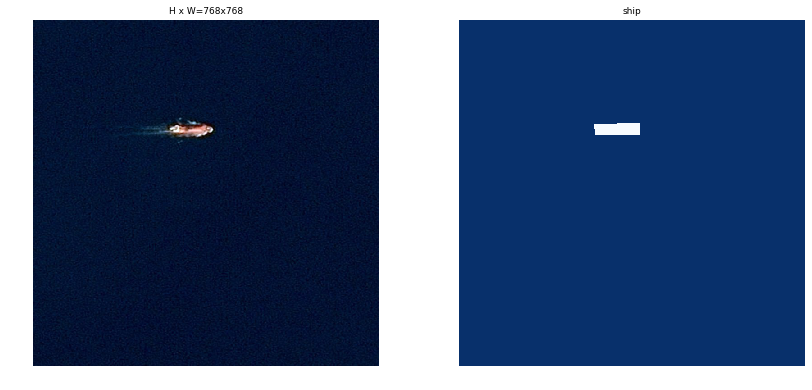

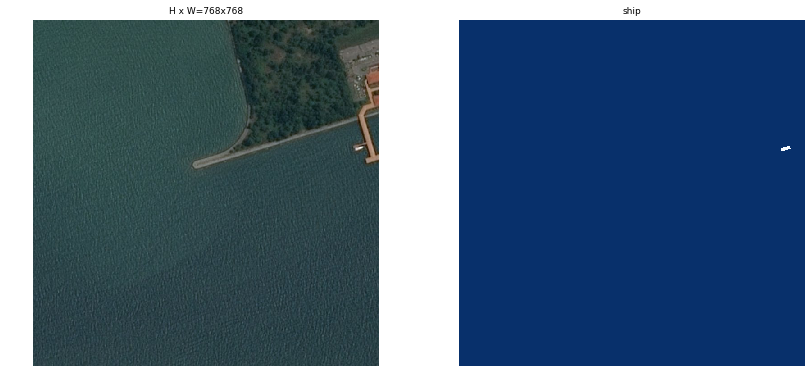

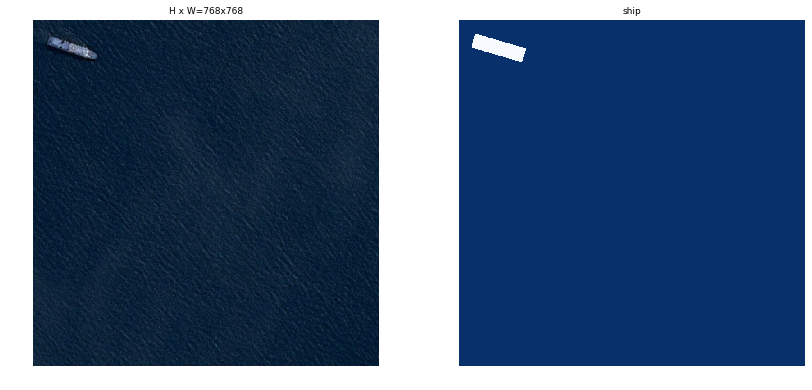

In [11]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 3)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

In [12]:
class ASDCGPUConfig(Config):
    """
    Configuration of Airbus Ship Detection Challenge Dataset 
    
    Overrides values in the base Config class.
    From https://github.com/samlin001/Mask_RCNN/blob/master/mrcnn/config.py
    
    Another useful resource:
    https://modeldepot.io/dani/mask-r-cnn
    https://towardsdatascience.com/mask-r-cnn-for-ship-detection-segmentation-a1108b5a083
    """
    
    # Give the configuration a recognizable name
    NAME = 'ASDC'
    
    # Using 1 GPU
    GPU_COUNT = 1
    
    # We use a GPU with 32GB memory, which can fit two images or more. 
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 2
    
    # Number of classes (ship or background)
    NUM_CLASSES = 2

    # Image dimensions
    IMAGE_MIN_DIM = IMAGE_WIDTH
    IMAGE_MAX_DIM = IMAGE_WIDTH
    
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 300
    
    VALIDATION_STEPS = 50
    
    SAVE_BEST_ONLY = True
    
    # Minimum probability value to accept a detected instance
    # ROIs below this threshold are skipped
    DETECTION_MIN_CONFIDENCE = 0.95

    # Non-maximum suppression threshold for detection
    # Keep it small to merge overlapping ROIs
    DETECTION_NMS_THRESHOLD = 0.05

In [13]:
config = ASDCGPUConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.95
DETECTION_NMS_THRESHOLD        0.05
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  768
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  768
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'mrcnn_class_loss': 1.0, 'rpn_class_loss': 1.0, 'mrcnn_mask_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'rpn_bbox_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE           

In [14]:
"""
Load the Mask-RCNN model weights.
"""
start_time = time.time()

model = modellib.MaskRCNN(mode="training", config=config, model_dir=WORKING_DIR)
weights_path = COCO_WEIGHTS_PATH
# utils.download_trained_weights(weights_path)

print("Loading weights: ", weights_path)

model.load_weights(weights_path, by_name=True, 
                   exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",
                            "mrcnn_bbox", "mrcnn_mask"])

end_time = time.time() - start_time
print("loading weights: {}".format(end_time))

Instructions for updating:
Colocations handled automatically by placer.
Loading weights:  /home/jupyter/mask_rcnn_coco.h5
loading weights: 12.12057089805603


In [15]:
"""
Train the model.
"""
import datetime

start_time = time.time()

model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE,
            epochs=20, layers='all')

end_time = time.time() - start_time
print("Train model: {}".format(end_time))


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/jupyter/asdc20190519T2322/mask_rcnn_asdc_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b          (Bat

/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.5/dist-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/20
300/300 [==============================] - 405s 1s/step - loss: 1.0016 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.3020 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3372 - val_loss: 1.3631 - val_rpn_class_loss: 0.0202 - val_rpn_bbox_loss: 0.8338 - val_mrcnn_class_loss: 0.0401 - val_mrcnn_bbox_loss: 0.2338 - val_mrcnn_mask_loss: 0.2351
Epoch 2/20
300/300 [==============================] - 356s 1s/step - loss: 0.7563 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.1769 - mrcnn_mask_loss: 0.2570 - val_loss: 1.0932 - val_rpn_class_loss: 0.0134 - val_rpn_bbox_loss: 0.4639 - val_mrcnn_class_loss: 0.0409 - val_mrcnn_bbox_loss: 0.3046 - val_mrcnn_mask_loss: 0.2704
Epoch 3/20
300/300 [==============================] - 354s 1s/step - loss: 0.7851 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.3006 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.2574 - val_loss: 1.1677 - val_rpn_class_l

In [17]:
history = model.keras_model.history.history

for k in new_history: 
    history[k] = history[k] + new_history[k]
    
epochs = range(1, len(history['loss']) + 1)
pd.DataFrame(history, index=epochs)

,loss,mrcnn_bbox_loss,mrcnn_class_loss,mrcnn_mask_loss,rpn_bbox_loss,rpn_class_loss,val_loss,val_mrcnn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_mask_loss,val_rpn_bbox_loss,val_rpn_class_loss
1,1.001612,0.293002,0.060689,0.337246,0.301961,0.008706,1.363074,0.233850,0.040133,0.235059,0.833819,0.020206
2,0.756287,0.176928,0.038009,0.257035,0.275440,0.008868,1.093191,0.304610,0.040874,0.270360,0.463912,0.013427
3,0.785093,0.193272,0.022830,0.257445,0.300570,0.010969,1.167704,0.256488,0.057809,0.271370,0.566497,0.015533
4,0.673717,0.166377,0.032137,0.261025,0.206625,0.007545,1.675784,0.291021,0.066837,0.310949,0.978482,0.028488
5,0.825320,0.184002,0.024248,0.281163,0.325413,0.010487,0.893301,0.213481,0.024073,0.242444,0.408177,0.005118
6,0.692872,0.160801,0.026851,0.261074,0.236920,0.007219,1.183197,0.330398,0.040853,0.427395,0.367796,0.016747
7,0.656647,0.149267,0.032345,0.238549,0.226240,0.010239,0.761884,0.221861,0.034105,0.305036,0.191229,0.009646
8,0.807493,0.175410,0.028518,0.289847,0.305344,0.008367,1.092514,0.198986,0.035330,0.222253,0.629014,0.006924
9,0.747817,0.165887,0.030557,0.255303,0.286035,0.010029,0.922439,0.301367,0.057307,0.301332,0.253550,0.008876
10,0.686157,0.169612,0.030712,0.256948,0.221198,0.007680,1.076484,0.315063,0.022364,0.322352,0.411720,0.004978


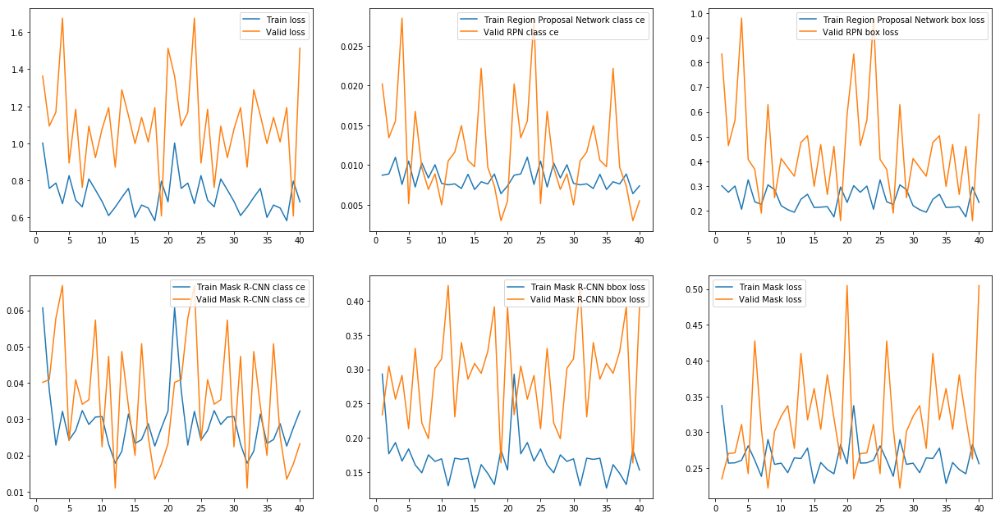

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(21, 11))

plt.subplot(231)
plt.plot(epochs, history["loss"], label="Train loss")
plt.plot(epochs, history["val_loss"], label="Valid loss")
plt.legend()

plt.subplot(232)
plt.plot(epochs, history["rpn_class_loss"], label="Train Region Proposal Network class ce")
plt.plot(epochs, history["val_rpn_class_loss"], label="Valid RPN class ce")
plt.legend()

plt.subplot(233)
plt.plot(epochs, history["rpn_bbox_loss"], label="Train Region Proposal Network box loss")
plt.plot(epochs, history["val_rpn_bbox_loss"], label="Valid RPN box loss")
plt.legend()

plt.subplot(234)
plt.plot(epochs, history["mrcnn_class_loss"], label="Train Mask R-CNN class ce")
plt.plot(epochs, history["val_mrcnn_class_loss"], label="Valid Mask R-CNN class ce")
plt.legend()

plt.subplot(235)
plt.plot(epochs, history["mrcnn_bbox_loss"], label="Train Mask R-CNN bbox loss")
plt.plot(epochs, history["val_mrcnn_bbox_loss"], label="Valid Mask R-CNN bbox loss")
plt.legend()

plt.subplot(236)
plt.plot(epochs, history["mrcnn_mask_loss"], label="Train Mask loss")
plt.plot(epochs, history["val_mrcnn_mask_loss"], label="Valid Mask loss")
plt.legend()

plt.show()

In [19]:
'''
Create model object in inference mode.
'''
class InferenceConfig(ASDCGPUConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

infer_model = modellib.MaskRCNN(mode="inference", config=inference_config, model_dir=WORKING_DIR)
model_path = infer_model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
infer_model.load_weights(model_path, by_name=True)

Instructions for updating:
Use tf.cast instead.
Loading weights from  /home/jupyter/asdc20190519T2322/mask_rcnn_asdc_0019.h5
Re-starting from epoch 19


Processing 1 images
image                    shape: (768, 768, 3)         min:    9.00000  max:  142.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -114.70000  max:   36.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


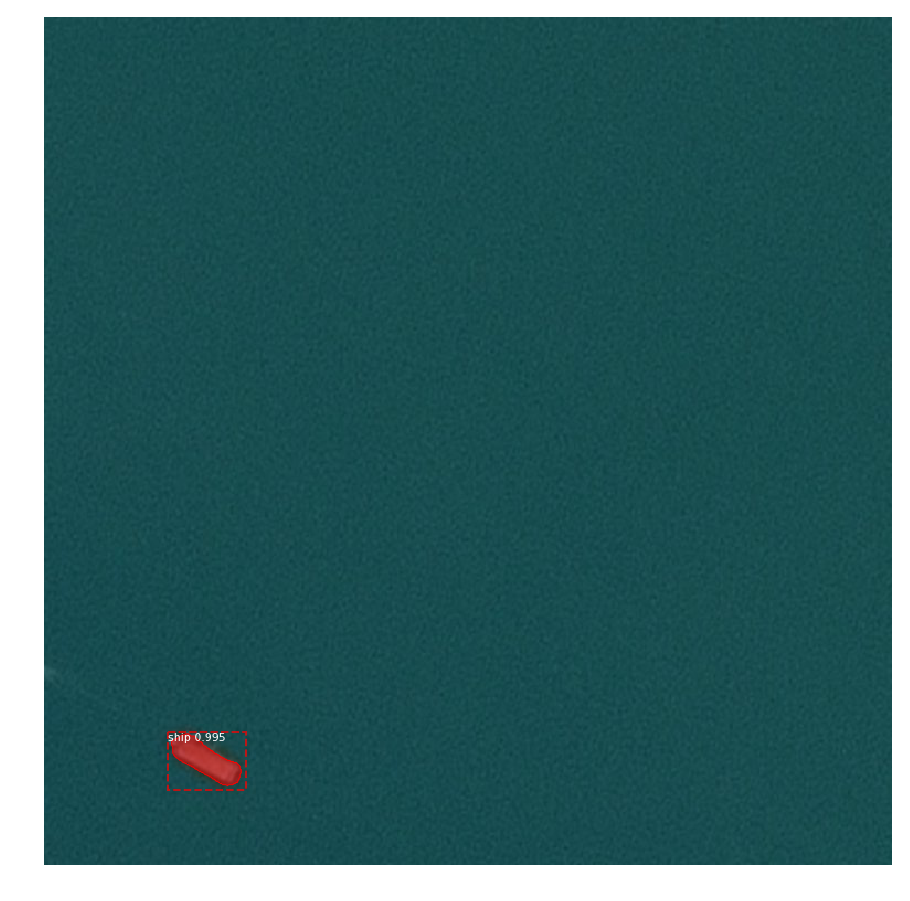

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  130.30000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


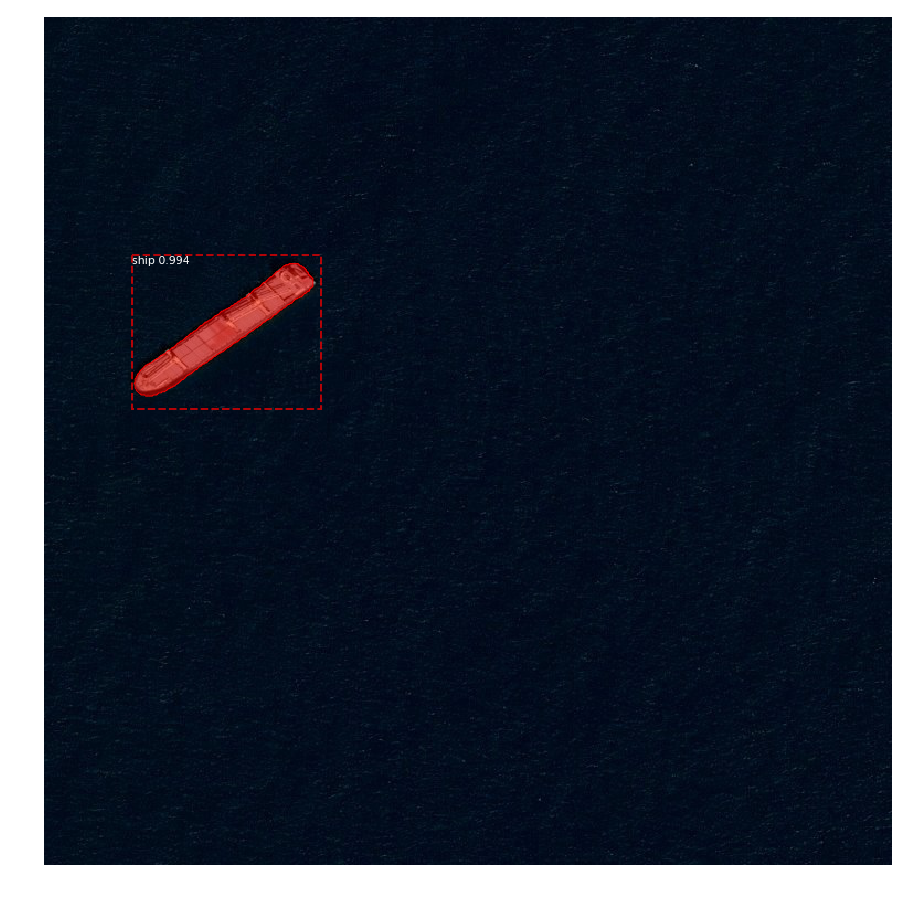

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


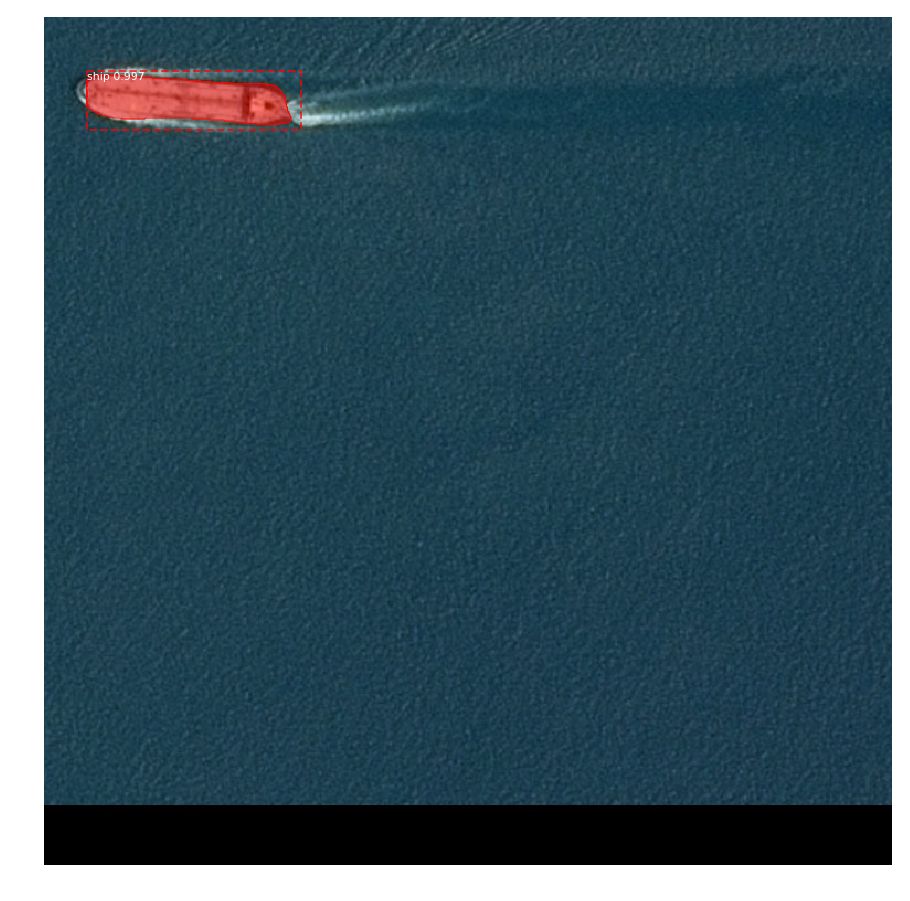

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


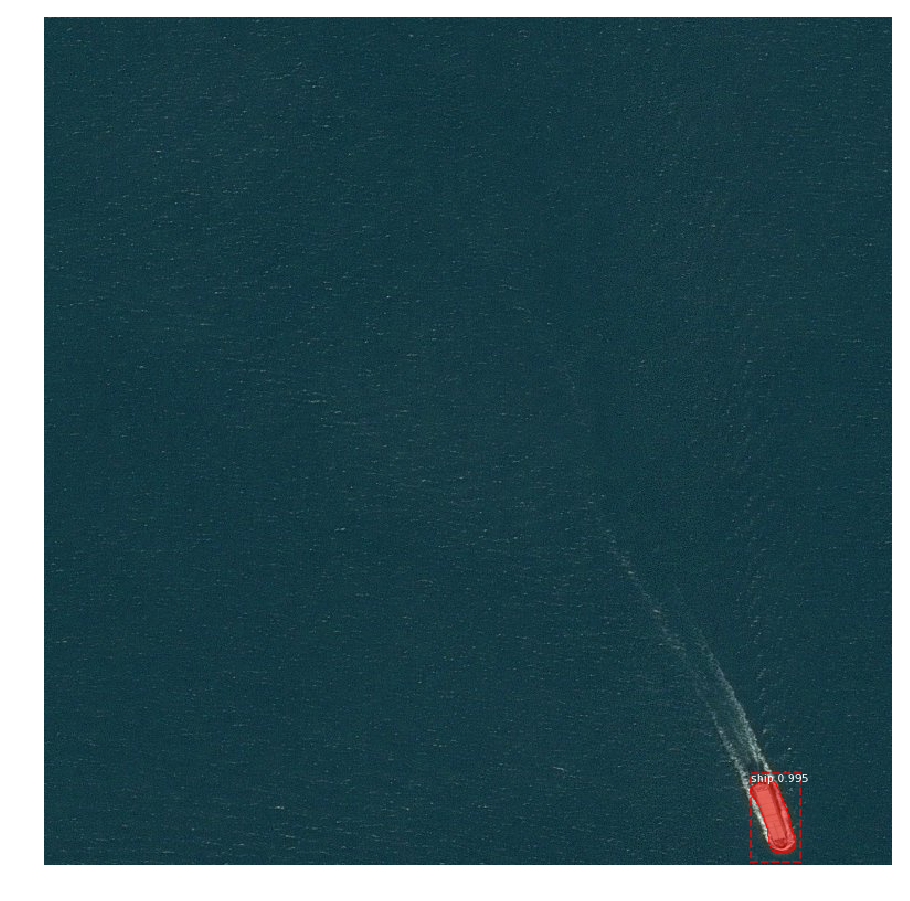

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


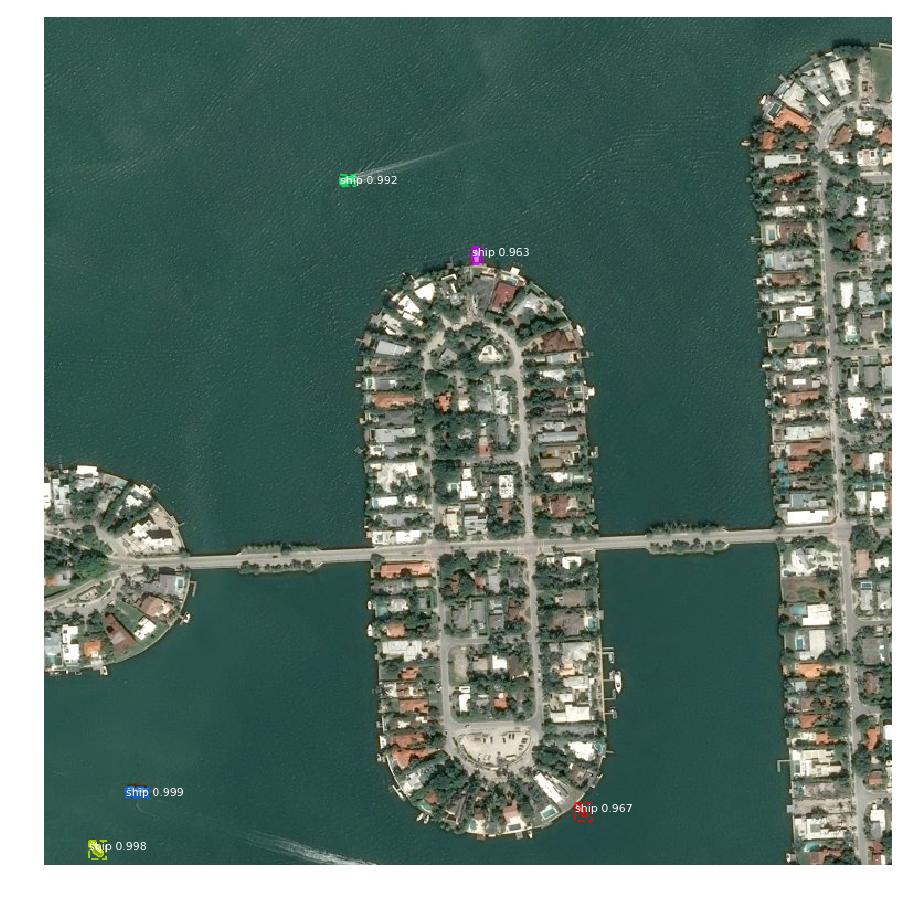

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  164.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   60.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



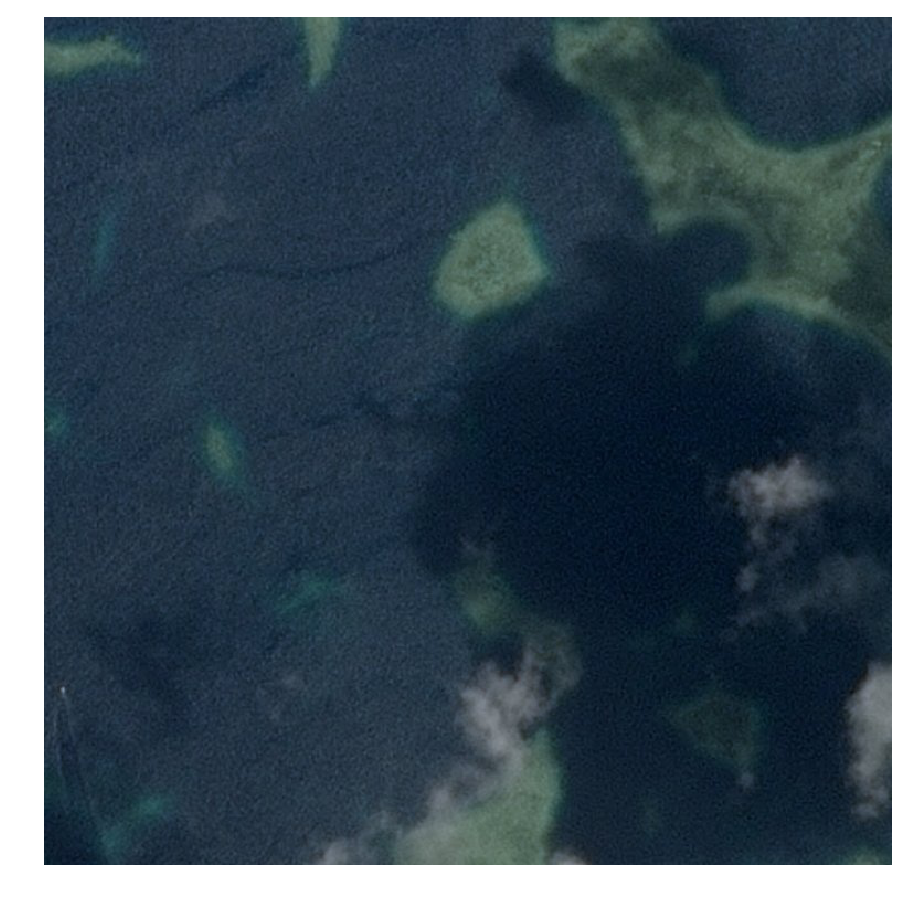

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  190.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   86.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


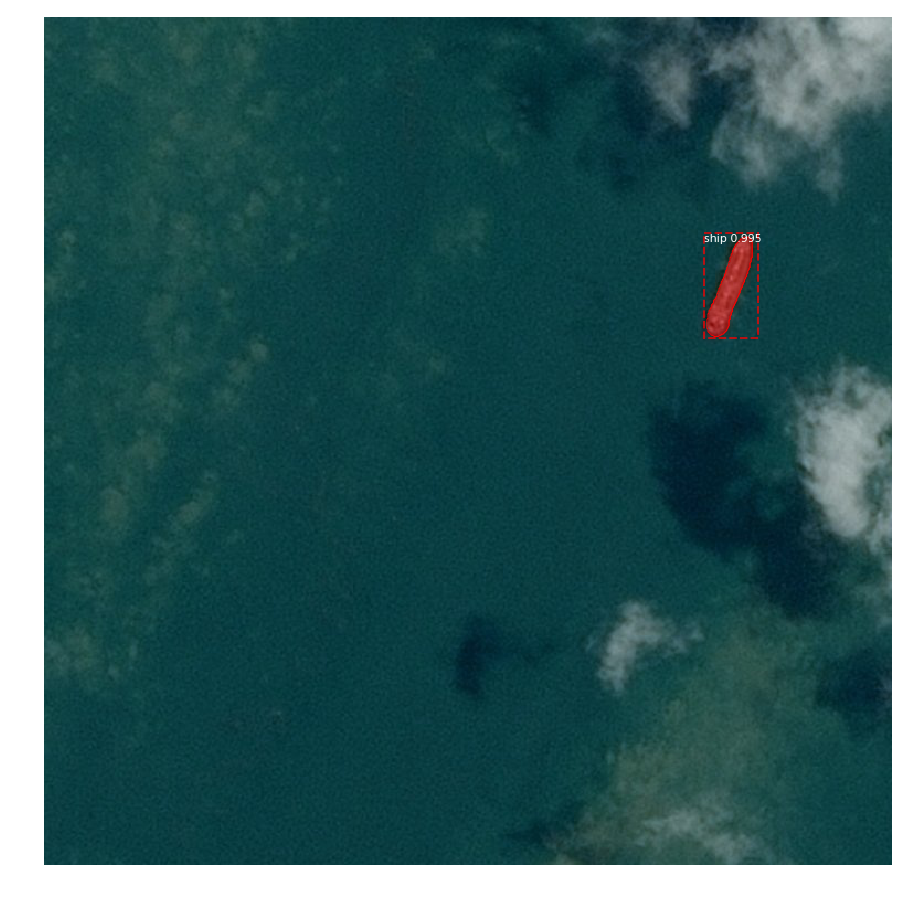

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  144.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


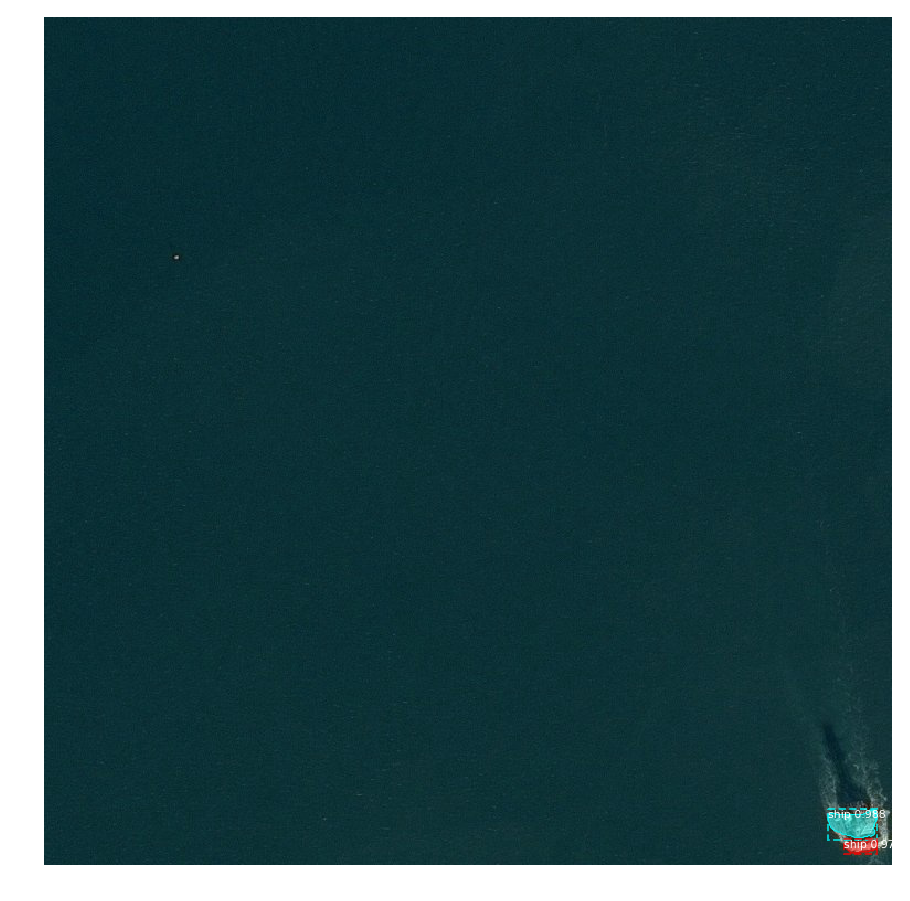

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -113.70000  max:  147.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


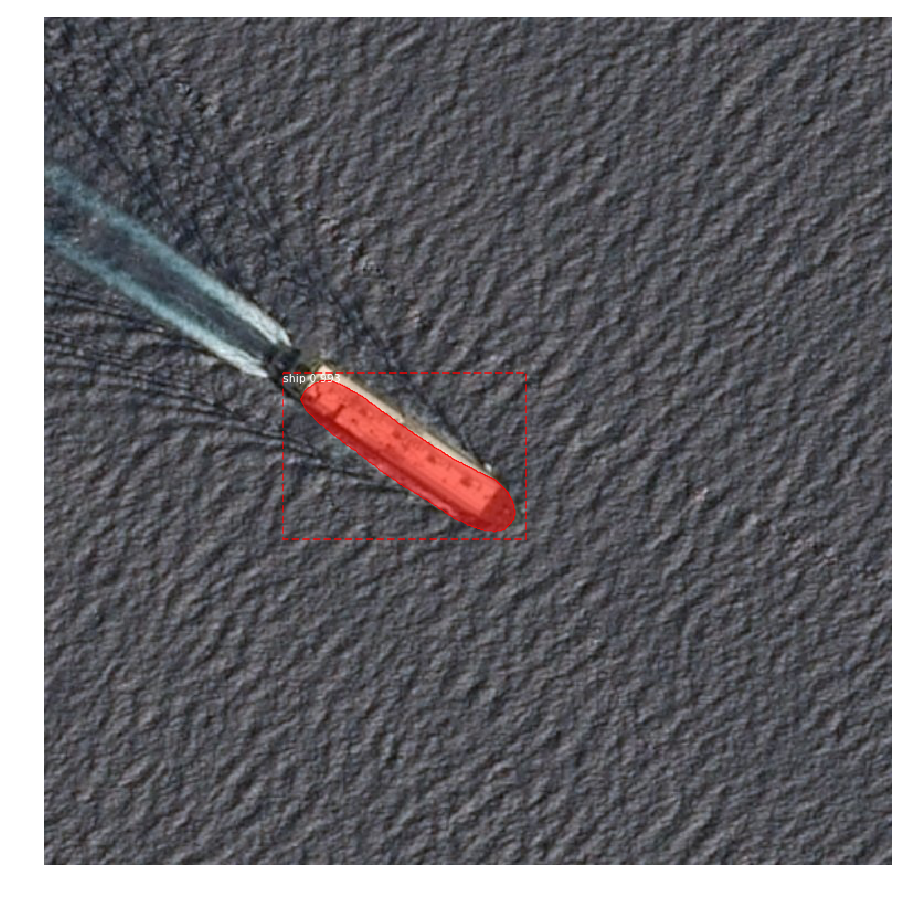

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  221.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  111.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


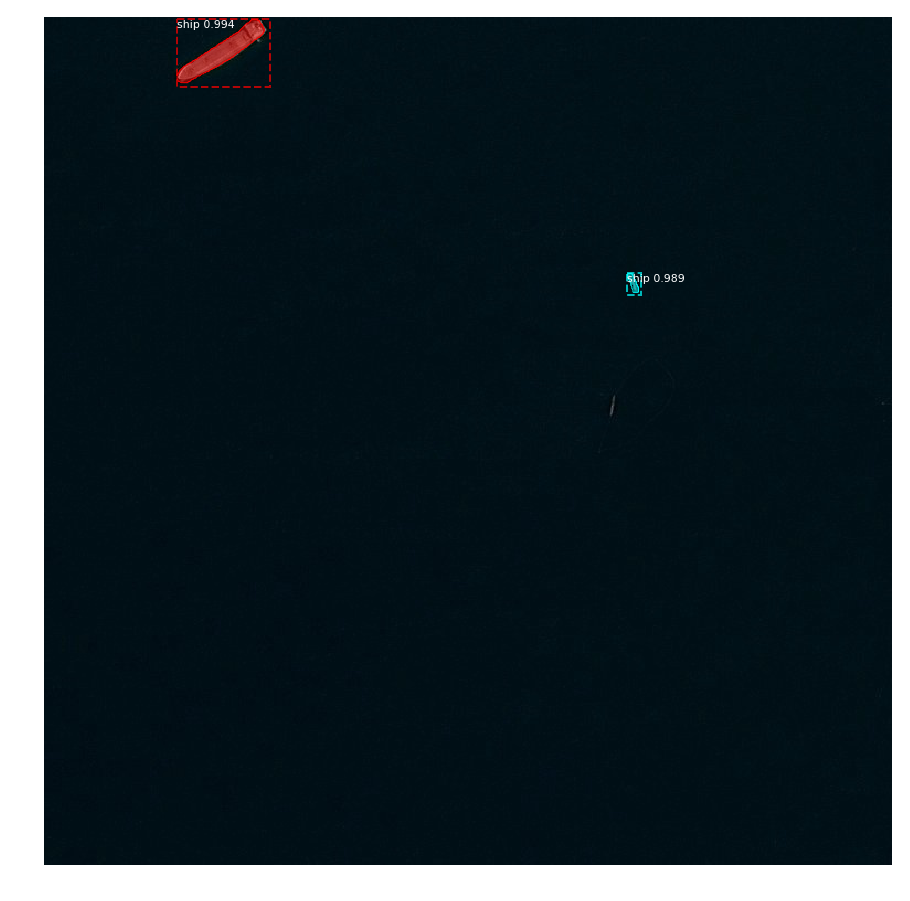

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


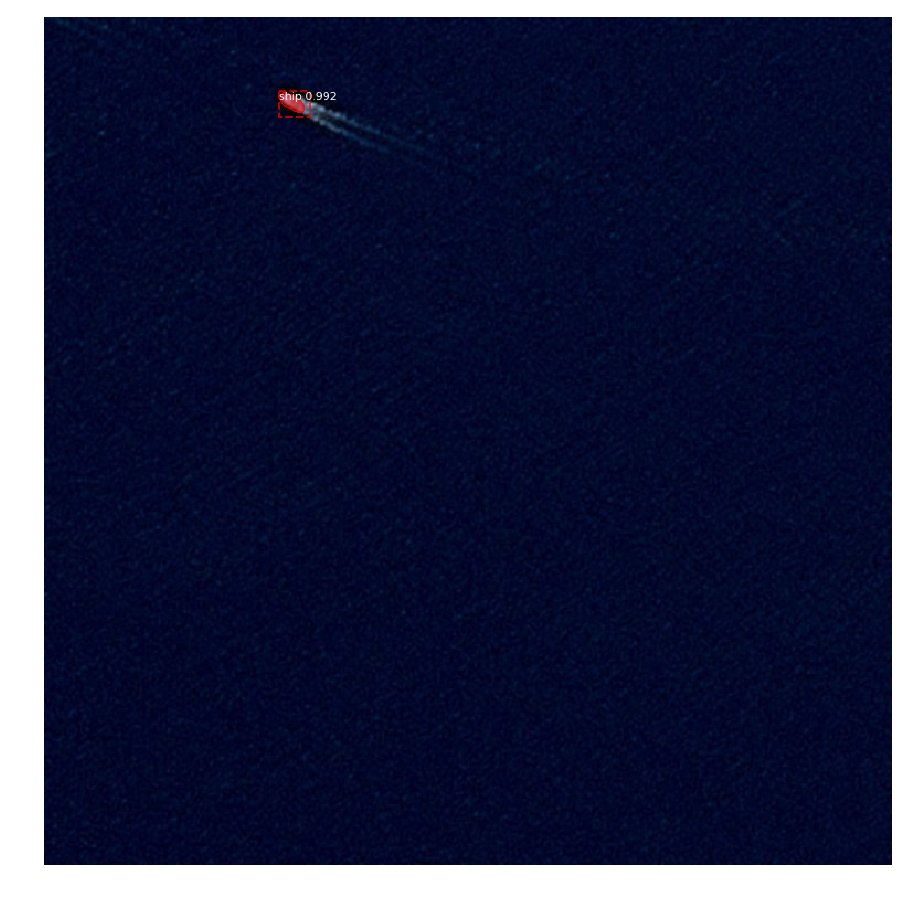

Processing 1 images
image                    shape: (768, 768, 3)         min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -122.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


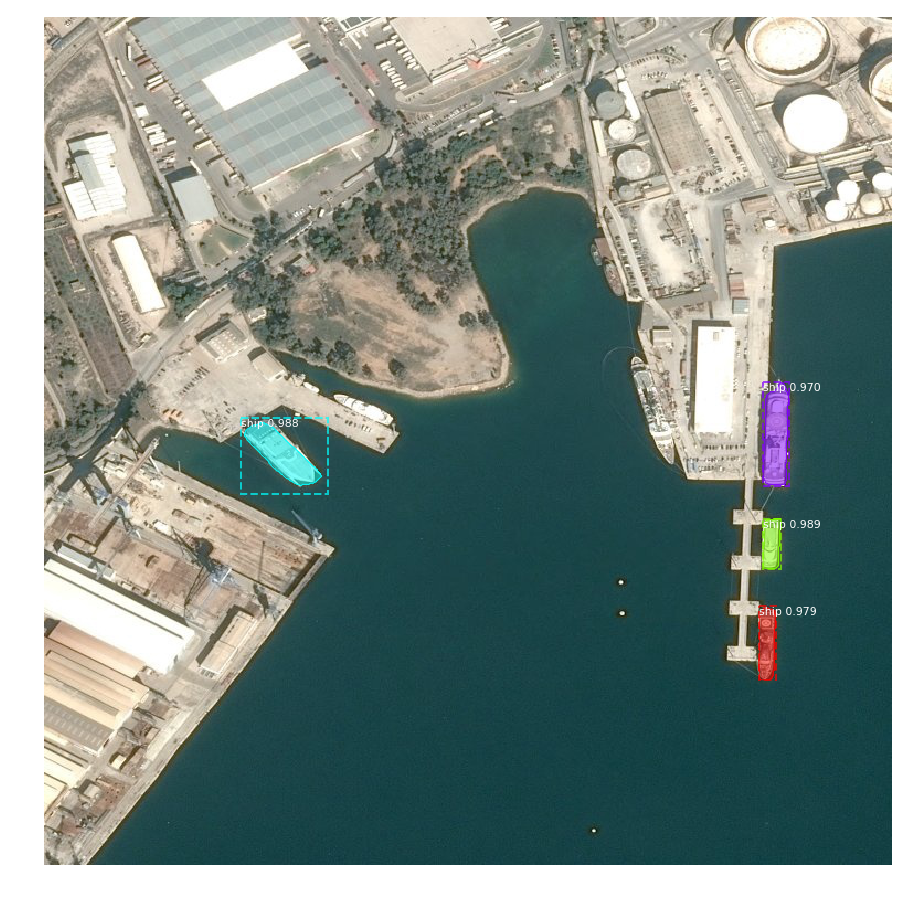

Processing 1 images
image                    shape: (768, 768, 3)         min:   21.00000  max:  187.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -102.70000  max:   72.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


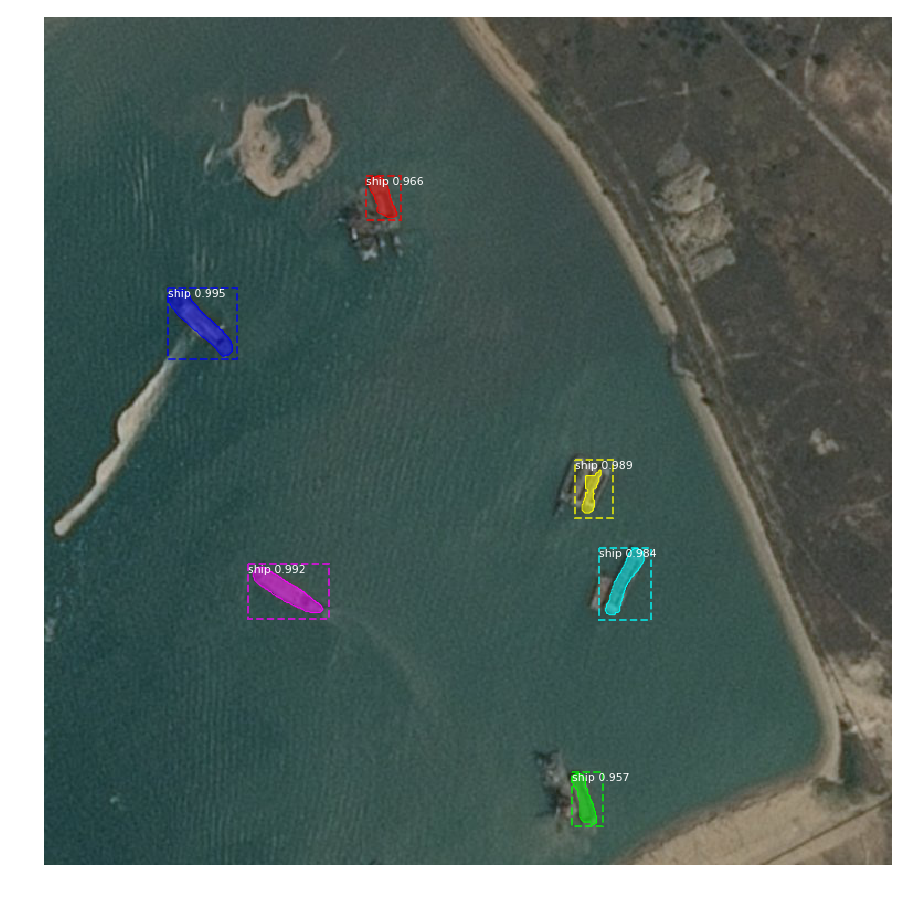

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


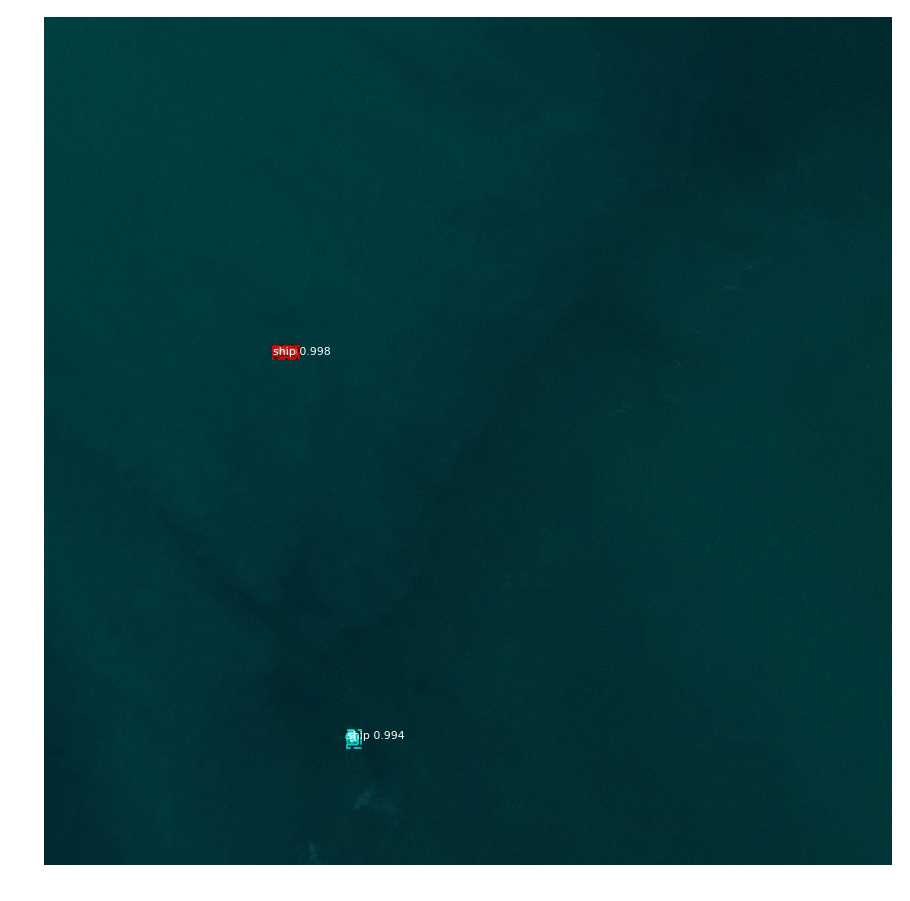

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -118.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


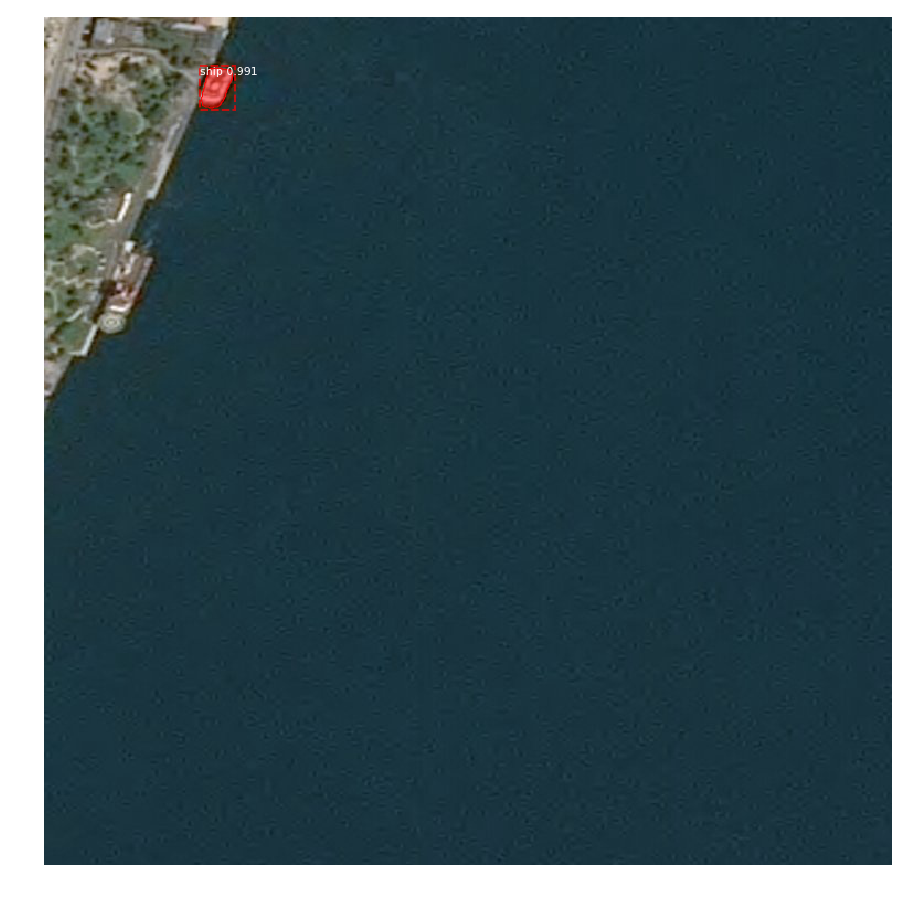

Processing 1 images
image                    shape: (768, 768, 3)         min:    3.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -112.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


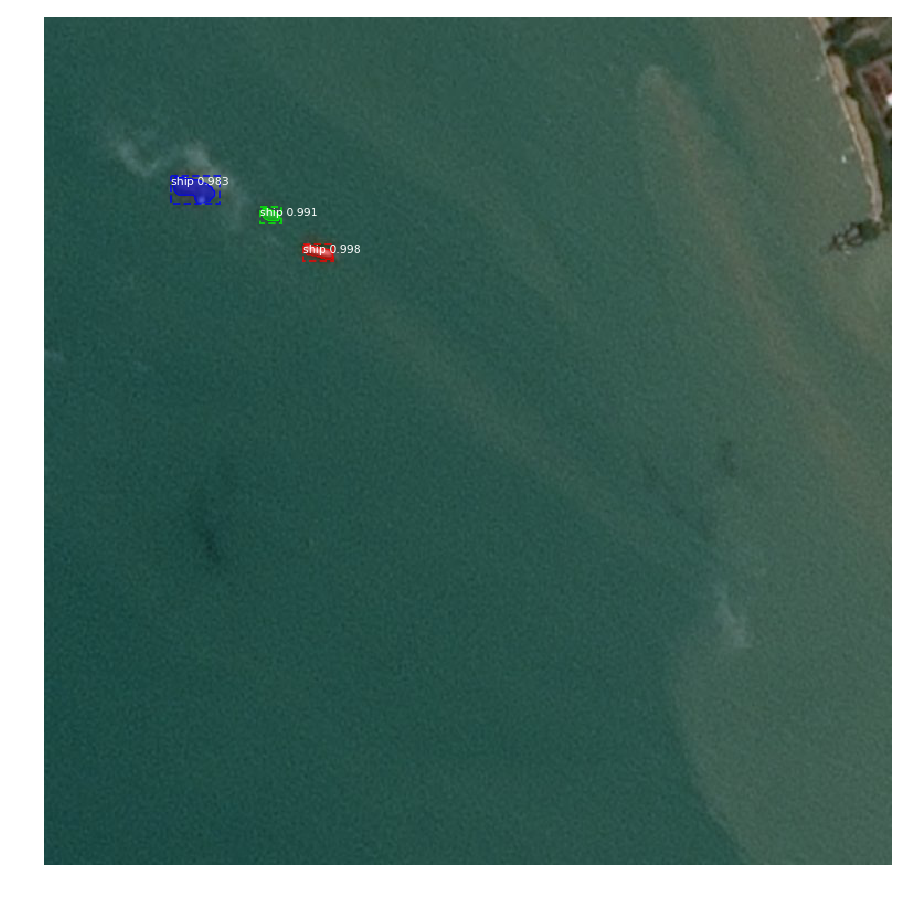

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  189.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   85.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


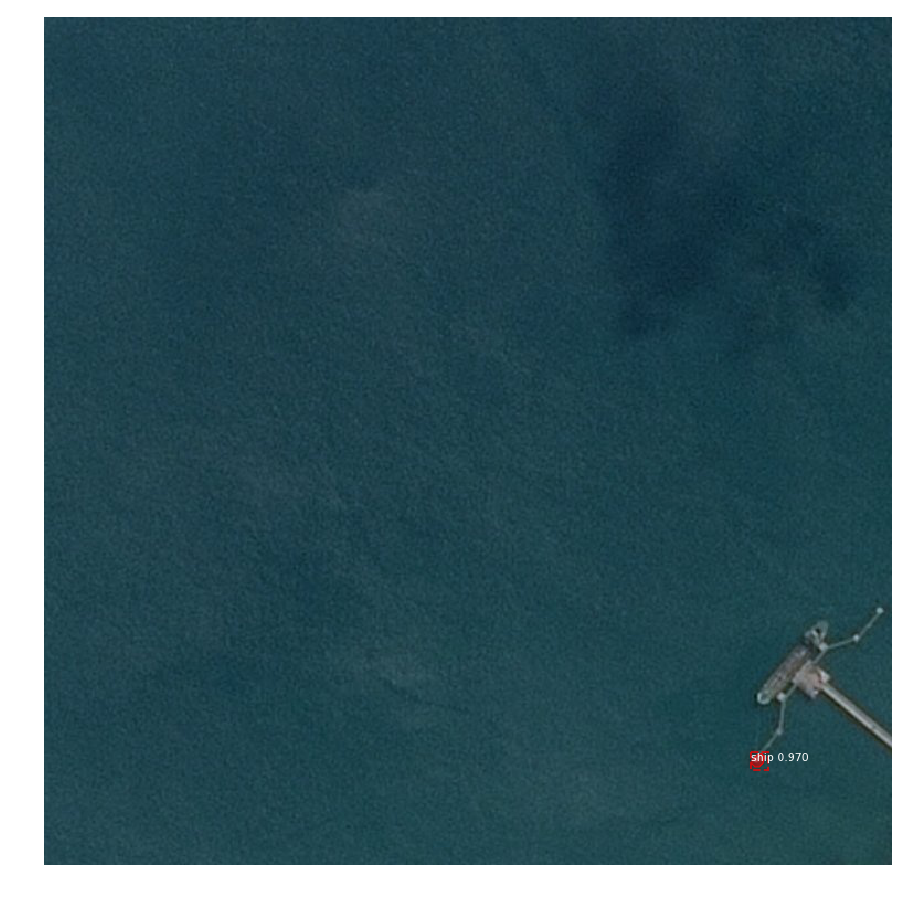

Processing 1 images
image                    shape: (768, 768, 3)         min:   24.00000  max:  254.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -93.70000  max:  137.20000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


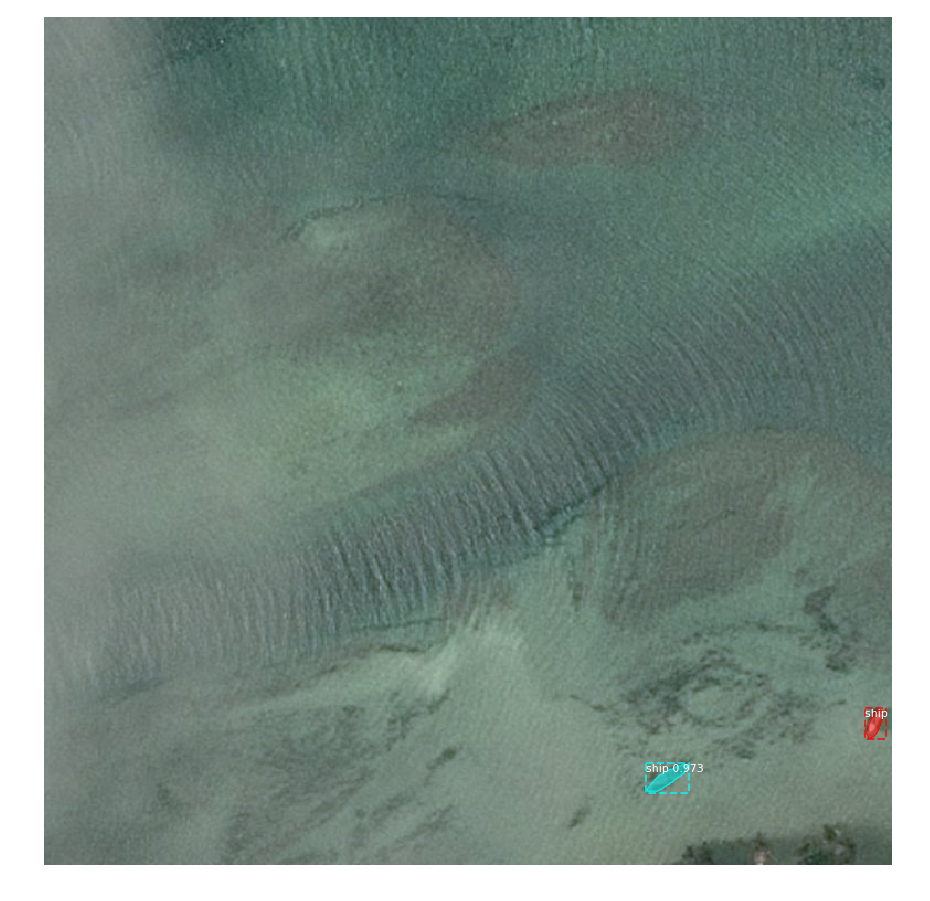

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


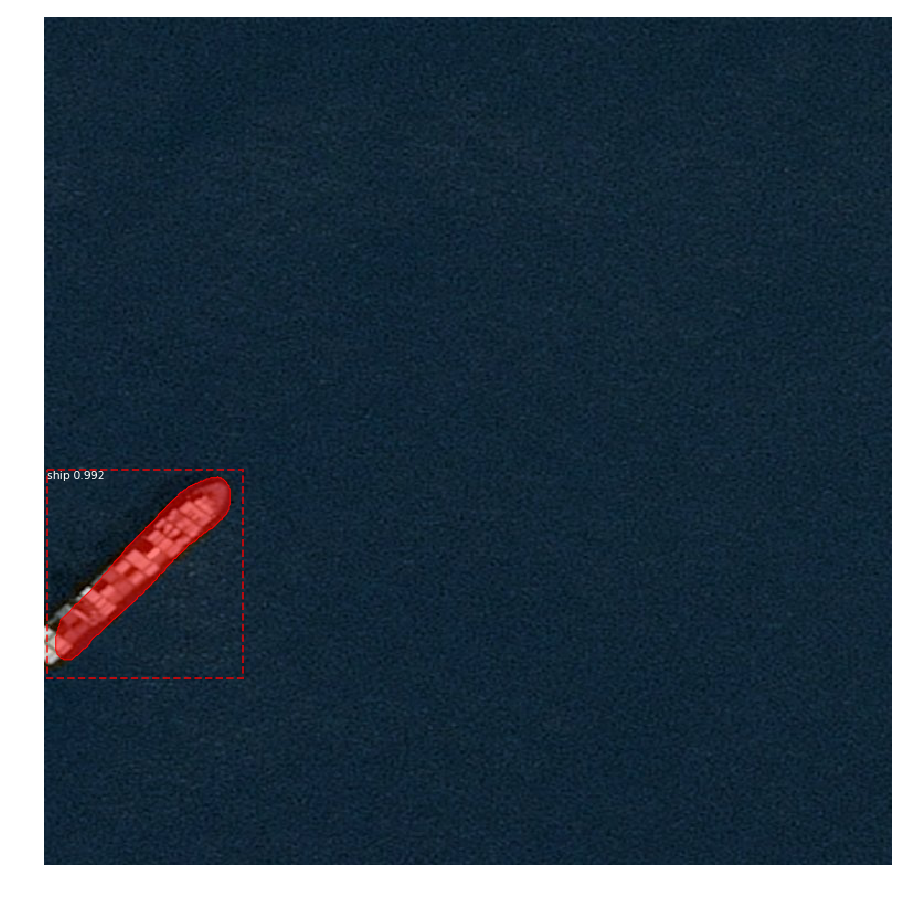

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  217.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  113.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


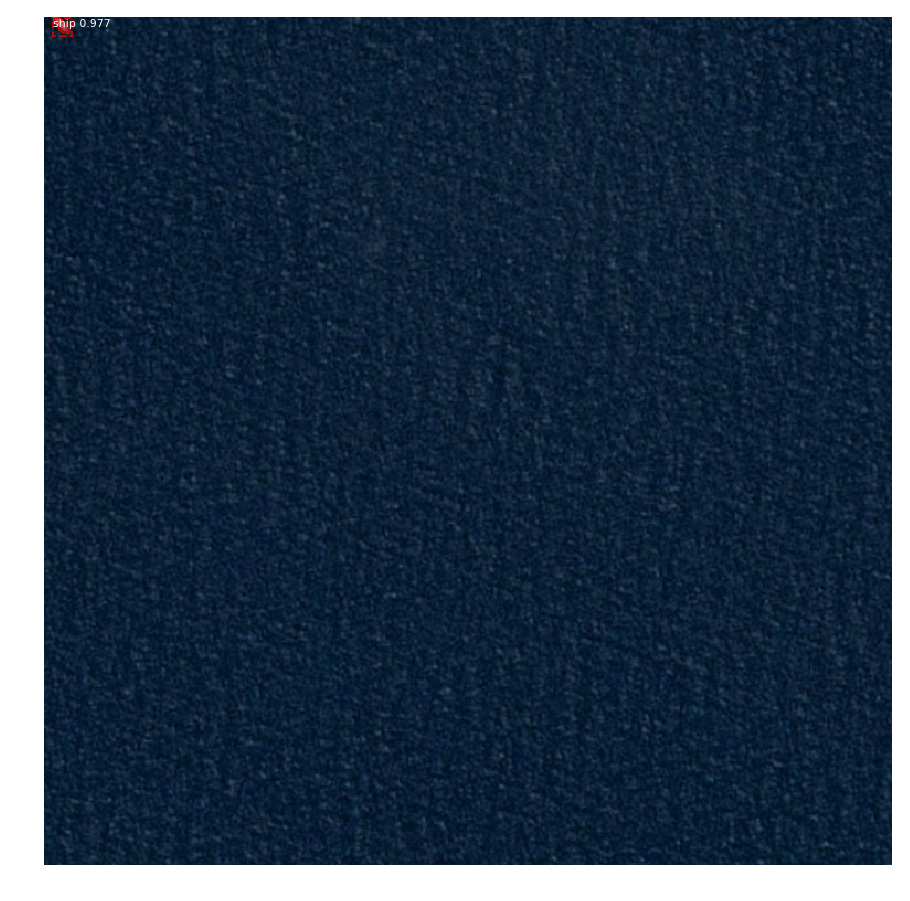

In [22]:
image_ids = np.random.choice(dataset_val.image_ids, 20)
APs = []
inference_start = time.time()
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = infer_model.detect([image], verbose=1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'])

In [23]:
'''
Load the ASDC classifier to classifiying if an image contains ships or not.
'''
from keras.models import load_model
from keras.preprocessing import image
import numpy as np

img_width = 768
img_height = 768

model = load_model('ASDCResNetClassifier.h5')

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [ ]:
'''
Predicting images
'''

# img = image.load_img('Data/input/test_v2/1cf417b95.jpg', target_size=(256, 256))
# x = image.img_to_array(img)
# x = np.expand_dims(x, axis=0)

# images = np.vstack([x])
# classes = model.predict(images)
# print(classes)

# if(classes[0][1] > 0.80):
#     print("has ship")
# else:
#     print("no ship")


In [ ]:
'''
Kaggel Submission Start (run the next few cells below)
'''

from skimage import io
from keras.models import load_model
from keras.preprocessing import image
import numpy as np

SAMPLE_SUBMISSION_PATH = os.path.join(INPUT_DIR, 'sample_submission_v2.csv')

images_path = TEST_DATA_PATH
sample_sub_csv = SAMPLE_SUBMISSION_PATH
sample_submission_df = pd.read_csv(os.path.join(images_path,sample_sub_csv))
unique_image_ids = sample_submission_df.ImageId.unique()

out_pred_rows = []
count = 0

for image_id in unique_image_ids:
    image_path = os.path.join(images_path, image_id)
    if os.path.isfile(image_path):
        count += 1
        print("Step: ", count)

        # Start counting prediction time
        tic = time.clock()

        # predict if the image contains a ship or not
        img = image.load_img(image_path, target_size=(256, 256))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        images = np.vstack([x])
        classes = model.predict(images)
    
        # if the image has a ship with probability greater than 80%
        if(classes[0][1] > 0.75):
            img = io.imread(image_path)
            results = infer_model.detect([img], verbose=1)
            r = results[0]

            re_encoded_to_rle_list = []
            for i in np.arange(np.array(r['masks']).shape[-1]):
                boolean_mask = r['masks'][:,:,i]
                re_encoded_to_rle = rle_encode(boolean_mask)
                re_encoded_to_rle_list.append(re_encoded_to_rle)

            if len(re_encoded_to_rle_list) == 0:
                out_pred_rows += [{'ImageId': image_id, 'EncodedPixels': None}]
                print("Found Ship: ", "NO")
            else:
                for rle_mask in re_encoded_to_rle_list:
                    out_pred_rows += [{'ImageId': image_id, 'EncodedPixels': rle_mask}]
                    print("Found Ship: ", rle_mask)            
        else:
            out_pred_rows += [{'ImageId': image_id, 'EncodedPixels': None}]

        toc = time.clock()
        print("Prediction time: ", toc-tic)
            
submission_df = pd.DataFrame(out_pred_rows)[['ImageId', 'EncodedPixels']]

filename = "{}{:%Y%m%dT%H%M}.csv".format("submission_", datetime.datetime.now())
submission_df.to_csv(filename, index=False)

Step:  1
Prediction time:  4.276914000000033
Step:  2
Prediction time:  0.037014999999883
Step:  3
Prediction time:  0.031688000000031025
Step:  4
Prediction time:  0.031221000000186905
Step:  5
Prediction time:  0.030969999999797437
Step:  6
Prediction time:  0.03169900000011694
Step:  7
Prediction time:  0.03243899999961286
Step:  8
Prediction time:  0.030894999999873107
Step:  9
Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  133.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32
Found Ship:  184574 17 185339 23 186104 29 186871 32 187637 36 188404 39 189171 42 189939 44 190707 45 191474 48 192242 50 193010 52 193778 54 194546 56 195314 58 196082 59 196850 61 197618 64 198386 67 199154 69 19

In [ ]:
'''
Creating the final submission file.

Sometimes mask processing may result in mask overlap and the corresponding error when the prediction is submitted. 
This kernel removes overlapping pixels.

https://www.kaggle.com/iafoss/remove-overlap.

'''

import pandas as pd
import numpy as np
from tqdm import tqdm

INPUT = filename
OUTPUT = 'submission_final.csv'

def get_mask(img_id, df, shape = (768,768)):
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    px = df.loc[img_id]['EncodedPixels']
    if(type(px) == float): 
        return None
    elif(type(px) == str): 
        px = [px]
    count = 1
    for mask in px:
        if(type(mask) == float):
            if len(px) == 1: return None
            else: continue
        s = mask.split()
        for i in range(len(s)//2):
            start = int(s[2*i]) - 1
            length = int(s[2*i+1])
            #keep previous prediction for overlapping pixels
            img[start:start+length] = count*(img[start:start+length] == 0)
        count+=1
    return img.reshape(shape).T

def decode_mask(mask, shape=(768, 768)):
    pixels = mask.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    if (len(runs) == 0): 
        return np.nan
    runs[runs > shape[0]*shape[1]] = shape[0]*shape[1]
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def set_masks(mask):
    n = mask.max()
    result = []
    for i in range(1,n+1):
        result.append(decode_mask(mask == i))
    return result

pred_df = pd.read_csv(INPUT).set_index('ImageId')
pred_df.head()

In [ ]:
'''
Create file to submit to kaggle challenge
'''
names = list(set(pred_df.index))
ship_list_dict = []

for name in tqdm(names):
    mask = get_mask(name, pred_df)
    if (not isinstance(mask, np.ndarray) and mask == None) or mask.sum() == 0:
        ship_list_dict.append({'ImageId':name,'EncodedPixels':np.nan})
    else:
        encodings = set_masks(mask)
        
        if(len(encodings) == 0):
            ship_list_dict.append({'ImageId':name,'EncodedPixels':np.nan})
            continue
        
        buf =[]
        
        for e in encodings:
            if e == e: buf.append(e)
        
        encodings = buf
        
        if len(encodings) == 0: 
            encodings = [np.nan]
        
        for encoding in encodings:
            ship_list_dict.append({'ImageId':name,'EncodedPixels':encoding})
            
pred_df_cor = pd.DataFrame(ship_list_dict)
pred_df_cor.to_csv(OUTPUT, index=False)